# INRIA Dataset Exploration
## Исследование датасета INRIA Aerial Image Labeling

В этом ноутбуке мы:
1. Загрузим и визуализируем образцы из датасета
2. Проанализируем статистику масок (соотношение классов)
3. Проверим аугментации
4. Посчитаем площадь застройки на примерах

In [2]:
import sys
sys.path.append('../src')

import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from PIL import Image
import torch

from dataset import INRIADataset, create_dataloaders, get_train_transforms, get_val_transforms

%matplotlib inline
plt.style.use('seaborn-v0_8-darkgrid')

## 1. Проверка структуры датасета

In [3]:
DATA_ROOT = '../data/AerialImageDataset'

# Проверяем наличие файлов
data_path = Path(DATA_ROOT)
train_images = list((data_path / 'train' / 'images').glob('*.tif'))
train_masks = list((data_path / 'train' / 'gt').glob('*.tif'))
test_images = list((data_path / 'test' / 'images').glob('*.tif'))

print(f"Train images: {len(train_images)}")
print(f"Train masks: {len(train_masks)}")
print(f"Test images: {len(test_images)}")
print(f"\nПример имен файлов:")
for img in train_images[:5]:
    print(f"  {img.name}")

Train images: 180
Train masks: 180
Test images: 180

Пример имен файлов:
  austin1.tif
  austin10.tif
  austin11.tif
  austin12.tif
  austin13.tif


## 2. Визуализация образцов

In [4]:
def visualize_sample(image_path, mask_path=None, title=''):
    """Визуализирует изображение и маску"""
    image = np.array(Image.open(image_path))
    
    if mask_path is not None:
        mask = np.array(Image.open(mask_path))
        mask_binary = (mask > 0).astype(np.uint8)
        
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))
        
        # Оригинальное изображение
        axes[0].imshow(image)
        axes[0].set_title('RGB Image')
        axes[0].axis('off')
        
        # Маска
        axes[1].imshow(mask_binary, cmap='gray')
        axes[1].set_title('Ground Truth Mask')
        axes[1].axis('off')
        
        # Наложение
        overlay = image.copy()
        overlay[mask_binary == 1] = [255, 0, 0]  # Красный для зданий
        blended = 0.6 * image + 0.4 * overlay
        axes[2].imshow(blended.astype(np.uint8))
        axes[2].set_title('Overlay')
        axes[2].axis('off')
        
    else:
        plt.figure(figsize=(8, 8))
        plt.imshow(image)
        plt.title('RGB Image (Test - no mask available)')
        plt.axis('off')
    
    plt.suptitle(title, fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    # Статистика
    if mask_path is not None:
        building_pixels = np.sum(mask_binary)
        total_pixels = mask_binary.size
        building_ratio = building_pixels / total_pixels * 100
        
        # Расчет площади
        pixel_area_m2 = 0.09  # 30 см/пиксель = 0.09 м²/пиксель
        building_area_m2 = building_pixels * pixel_area_m2
        
        print(f"Статистика изображения {image_path.name}:")
        print(f"  Размер: {image.shape[:2]}")
        print(f"  Пикселей зданий: {building_pixels:,}")
        print(f"  Процент застройки: {building_ratio:.2f}%")
        print(f"  Площадь застройки: {building_area_m2:,.2f} м² = {building_area_m2/10000:.4f} га")
        print()

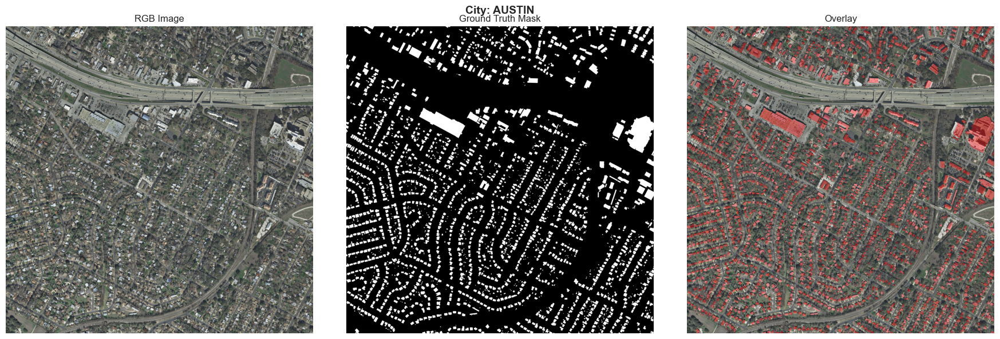

Статистика изображения austin1.tif:
  Размер: (5000, 5000)
  Пикселей зданий: 3,688,758
  Процент застройки: 14.76%
  Площадь застройки: 331,988.22 м² = 33.1988 га



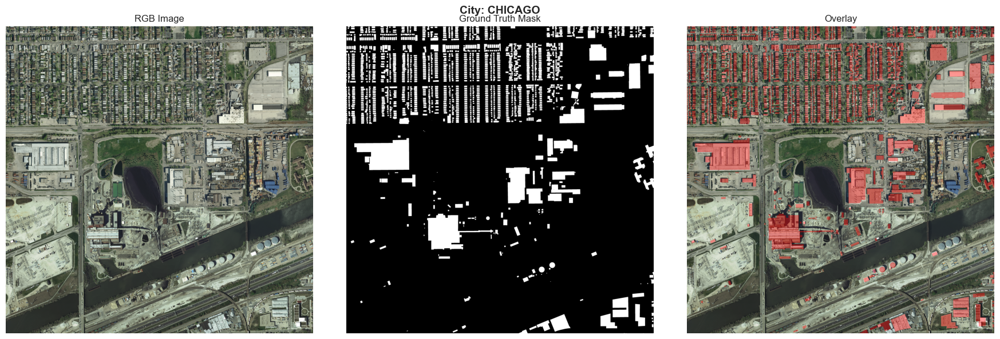

Статистика изображения chicago1.tif:
  Размер: (5000, 5000)
  Пикселей зданий: 3,590,930
  Процент застройки: 14.36%
  Площадь застройки: 323,183.70 м² = 32.3184 га



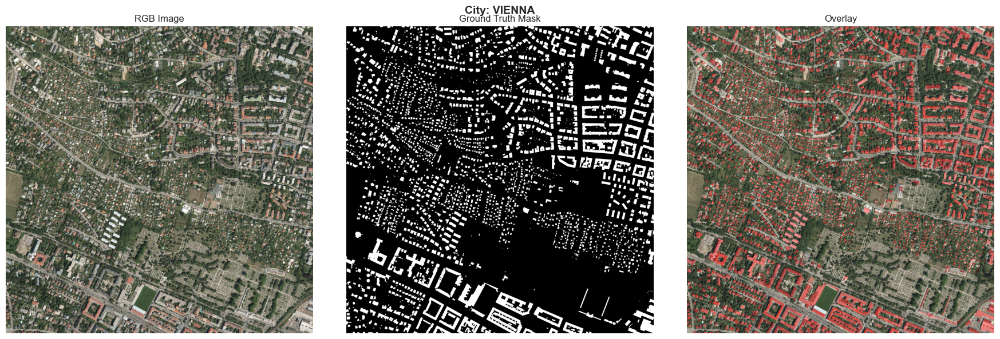

Статистика изображения vienna1.tif:
  Размер: (5000, 5000)
  Пикселей зданий: 4,510,838
  Процент застройки: 18.04%
  Площадь застройки: 405,975.42 м² = 40.5975 га



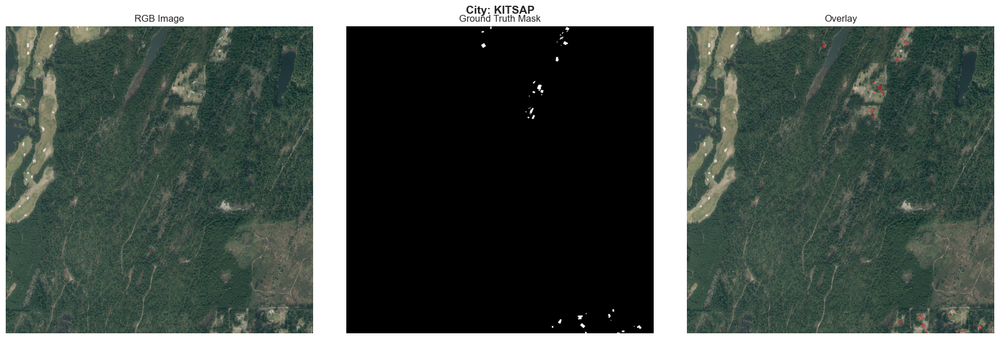

Статистика изображения kitsap1.tif:
  Размер: (5000, 5000)
  Пикселей зданий: 49,524
  Процент застройки: 0.20%
  Площадь застройки: 4,457.16 м² = 0.4457 га



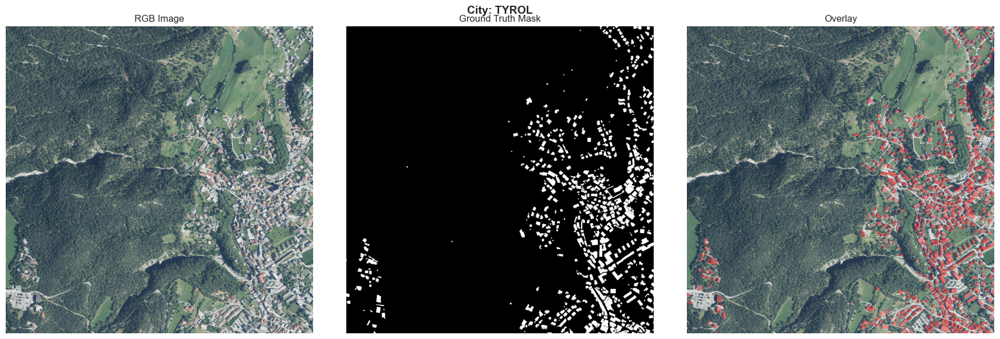

Статистика изображения tyrol-w1.tif:
  Размер: (5000, 5000)
  Пикселей зданий: 1,744,467
  Процент застройки: 6.98%
  Площадь застройки: 157,002.03 м² = 15.7002 га



In [5]:
# Визуализируем примеры из разных городов
cities = ['austin', 'chicago', 'vienna', 'kitsap', 'tyrol']

for city in cities:
    # Ищем первое изображение города
    for img_path in train_images:
        if img_path.stem.lower().startswith(city):
            mask_path = data_path / 'train' / 'gt' / img_path.name
            visualize_sample(img_path, mask_path, title=f"City: {city.upper()}")
            break

## 3. Анализ распределения классов

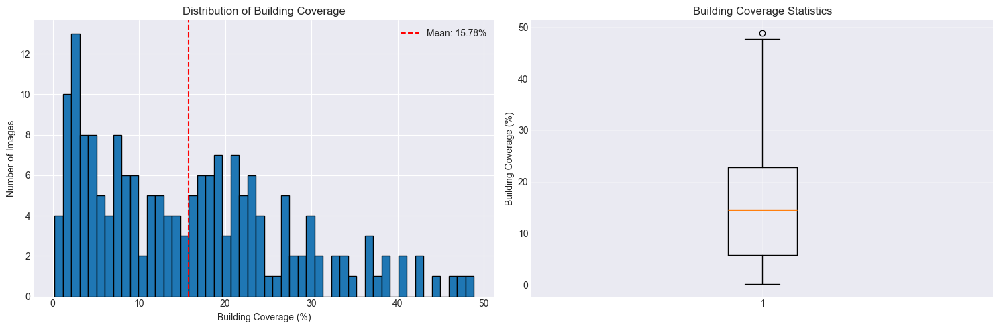


Класс баланс:
  Количество изображений: 180
  Среднее покрытие зданиями: 15.78%
  Медиана: 14.50%
  Std: 11.66%
  Min: 0.20%
  Max: 48.84%


In [6]:
def analyze_class_distribution(masks_dir, num_samples=None):
    """Анализирует распределение классов в масках"""
    masks_paths = list(Path(masks_dir).glob('*.tif'))
    
    if num_samples is not None:
        masks_paths = masks_paths[:num_samples]
    
    building_ratios = []
    
    for mask_path in masks_paths:
        mask = np.array(Image.open(mask_path))
        mask_binary = (mask > 0).astype(np.uint8)
        
        building_pixels = np.sum(mask_binary)
        total_pixels = mask_binary.size
        ratio = building_pixels / total_pixels
        
        building_ratios.append(ratio)
    
    building_ratios = np.array(building_ratios)
    
    # Визуализация
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))
    
    # Гистограмма
    axes[0].hist(building_ratios * 100, bins=50, edgecolor='black')
    axes[0].set_xlabel('Building Coverage (%)')
    axes[0].set_ylabel('Number of Images')
    axes[0].set_title('Distribution of Building Coverage')
    axes[0].axvline(building_ratios.mean() * 100, color='red', 
                    linestyle='--', label=f'Mean: {building_ratios.mean()*100:.2f}%')
    axes[0].legend()
    
    # Box plot
    axes[1].boxplot(building_ratios * 100, vert=True)
    axes[1].set_ylabel('Building Coverage (%)')
    axes[1].set_title('Building Coverage Statistics')
    axes[1].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # Статистика
    print("\nКласс баланс:")
    print(f"  Количество изображений: {len(building_ratios)}")
    print(f"  Среднее покрытие зданиями: {building_ratios.mean()*100:.2f}%")
    print(f"  Медиана: {np.median(building_ratios)*100:.2f}%")
    print(f"  Std: {building_ratios.std()*100:.2f}%")
    print(f"  Min: {building_ratios.min()*100:.2f}%")
    print(f"  Max: {building_ratios.max()*100:.2f}%")
    
    return building_ratios

# Анализируем train датасет
masks_dir = data_path / 'train' / 'gt'
ratios = analyze_class_distribution(masks_dir)

## 4. Проверка DataLoader и аугментаций

In [7]:
# Создаем DataLoader
train_loader, val_loader, test_loader = create_dataloaders(
    data_root=DATA_ROOT,
    batch_size=4,
    patch_size=512,
    stride=256,
)

Инициализирован train датасет:
  - Количество изображений: 180
  - Количество патчей: 58320
  - Размер патча: 512x512
  - Stride: 256
Инициализирован val датасет:
  - Количество изображений: 180
  - Количество патчей: 14580
  - Размер патча: 512x512
  - Stride: 512
Инициализирован test датасет:
  - Количество изображений: 144
  - Количество патчей: 11664
  - Размер патча: 512x512
  - Stride: 512

DATALOADER'Ы СОЗДАНЫ
Train: 58320 патчей, 14580 батчей
Val:   14580 патчей, 3645 батчей
Test:  11664 патчей, 2916 батчей
Batch size: 4


f:\inria_project\notebooks\../src\dataset.py:247: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=(10, 50), p=1.0),


Train batch (с аугментациями):


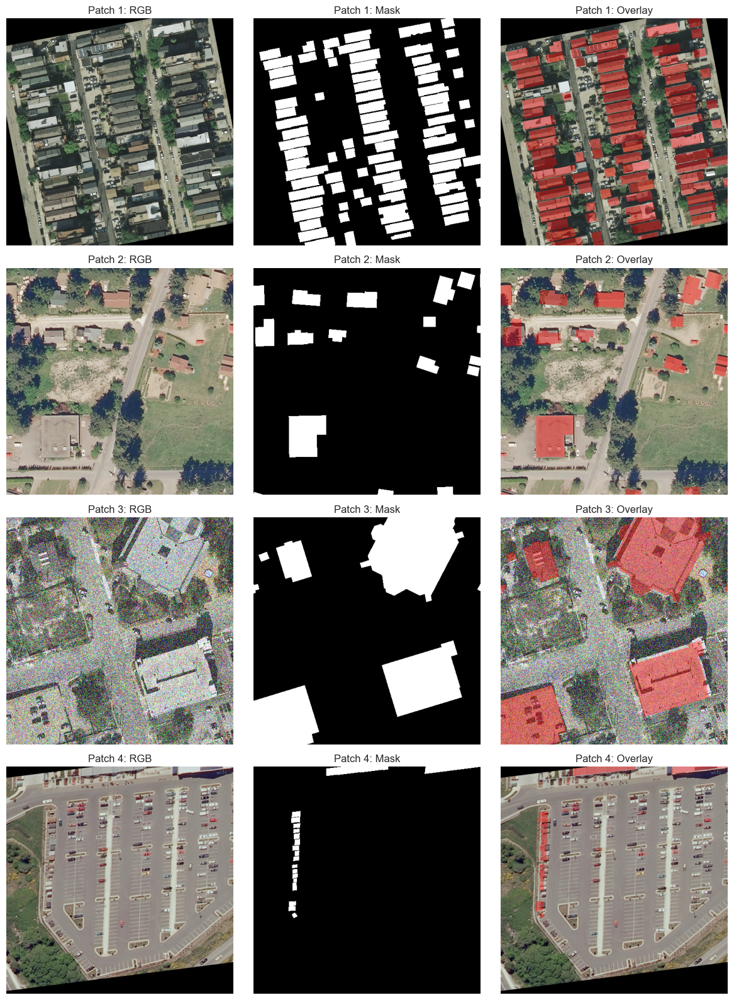

In [8]:
def denormalize(tensor, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    """Денормализация для визуализации"""
    tensor = tensor.clone()
    for t, m, s in zip(tensor, mean, std):
        t.mul_(s).add_(m)
    return torch.clamp(tensor, 0, 1)

def visualize_batch(batch, num_samples=4):
    """Визуализирует батч с аугментациями"""
    images = batch['image'][:num_samples]
    masks = batch['mask'][:num_samples]
    
    fig, axes = plt.subplots(num_samples, 3, figsize=(12, num_samples*4))
    
    if num_samples == 1:
        axes = axes.reshape(1, -1)
    
    for idx in range(num_samples):
        # Денормализуем изображение
        img = denormalize(images[idx]).permute(1, 2, 0).numpy()
        mask = masks[idx].numpy()
        
        # RGB
        axes[idx, 0].imshow(img)
        axes[idx, 0].set_title(f"Patch {idx+1}: RGB")
        axes[idx, 0].axis('off')
        
        # Mask
        axes[idx, 1].imshow(mask, cmap='gray')
        axes[idx, 1].set_title(f"Patch {idx+1}: Mask")
        axes[idx, 1].axis('off')
        
        # Overlay
        overlay = img.copy()
        overlay[mask == 1] = [1.0, 0, 0]
        blended = 0.6 * img + 0.4 * overlay
        axes[idx, 2].imshow(np.clip(blended, 0, 1))
        axes[idx, 2].set_title(f"Patch {idx+1}: Overlay")
        axes[idx, 2].axis('off')
    
    plt.tight_layout()
    plt.show()

# Визуализируем батч из train (с аугментациями)
batch = next(iter(train_loader))
print("Train batch (с аугментациями):")
visualize_batch(batch)

Validation batch (без аугментаций):


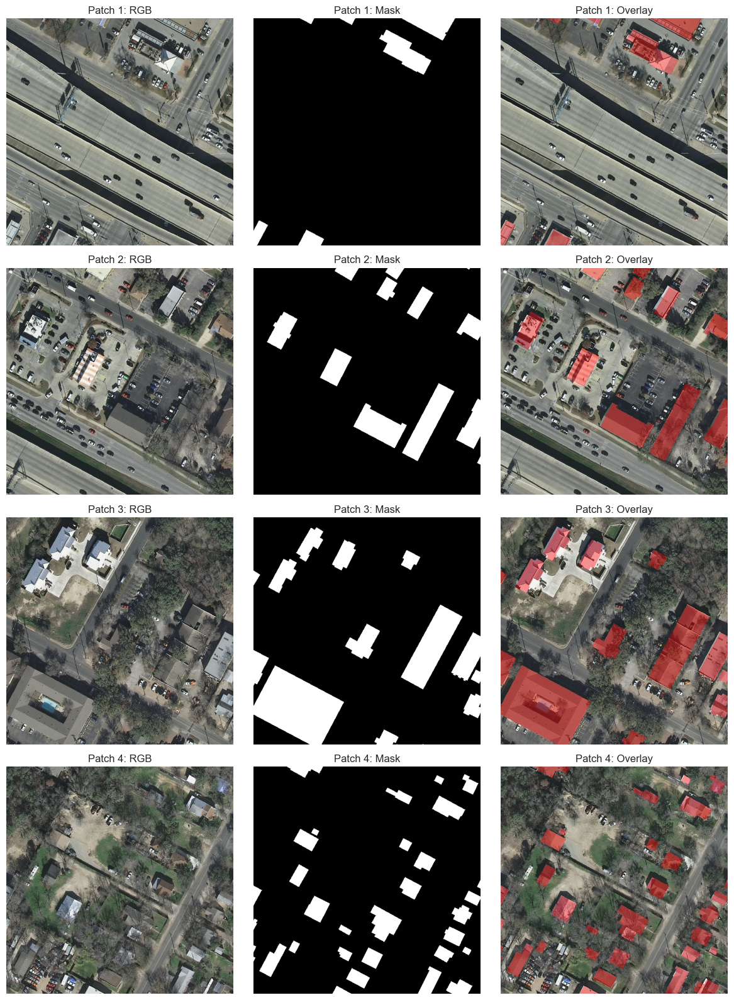

In [42]:
# Визуализируем батч из val (без аугментаций)
batch = next(iter(val_loader))
print("Validation batch (без аугментаций):")
visualize_batch(batch)

## 5. Проверка разных аугментаций на одном патче

Инициализирован train датасет:
  - Количество изображений: 180
  - Количество патчей: 14580
  - Размер патча: 512x512
  - Stride: 512
Инициализирован train датасет:
  - Количество изображений: 180
  - Количество патчей: 14580
  - Размер патча: 512x512
  - Stride: 512


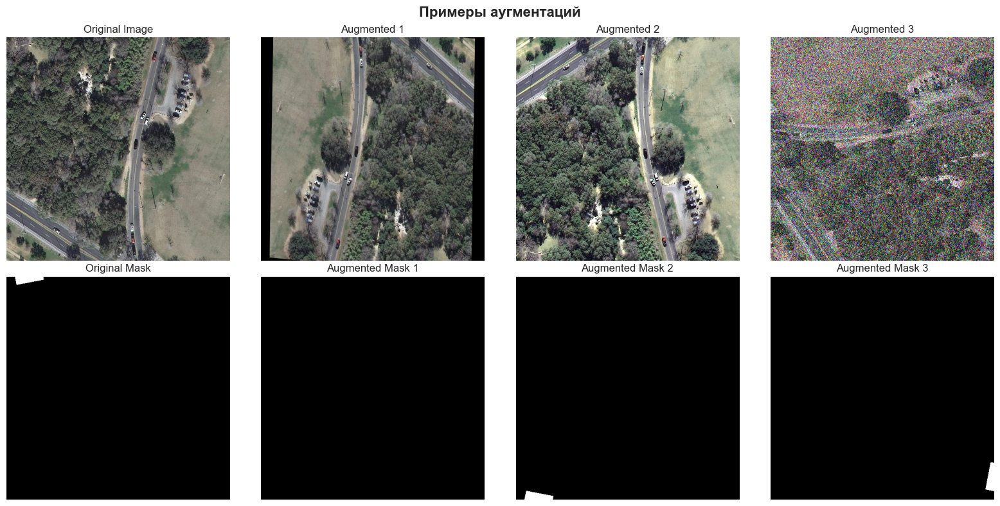

In [9]:
# Получаем один патч без аугментаций
dataset_no_aug = INRIADataset(
    data_root=DATA_ROOT,
    split='train',
    patch_size=512,
    transform=get_val_transforms(),
)

# Датасет с аугментациями
dataset_with_aug = INRIADataset(
    data_root=DATA_ROOT,
    split='train',
    patch_size=512,
    transform=get_train_transforms(),
)

# Берем один и тот же индекс
idx = 100

# Визуализируем оригинал и несколько аугментированных версий
fig, axes = plt.subplots(2, 4, figsize=(16, 8))

# Оригинал
sample_orig = dataset_no_aug[idx]
img_orig = denormalize(sample_orig['image']).permute(1, 2, 0).numpy()
mask_orig = sample_orig['mask'].numpy()

axes[0, 0].imshow(img_orig)
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

axes[1, 0].imshow(mask_orig, cmap='gray')
axes[1, 0].set_title('Original Mask')
axes[1, 0].axis('off')

# Аугментированные версии
for i in range(1, 4):
    sample_aug = dataset_with_aug[idx]
    img_aug = denormalize(sample_aug['image']).permute(1, 2, 0).numpy()
    mask_aug = sample_aug['mask'].numpy()
    
    axes[0, i].imshow(img_aug)
    axes[0, i].set_title(f'Augmented {i}')
    axes[0, i].axis('off')
    
    axes[1, i].imshow(mask_aug, cmap='gray')
    axes[1, i].set_title(f'Augmented Mask {i}')
    axes[1, i].axis('off')

plt.suptitle('Примеры аугментаций', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

## 6. Расчет площади застройки для полного изображения

In [10]:
def calculate_building_area(mask, pixel_size_m=0.3):
    """
    Рассчитывает площадь застройки
    
    Args:
        mask: Бинарная маска (0 - фон, 1 - здание)
        pixel_size_m: Размер пикселя в метрах
    
    Returns:
        area_m2: Площадь в квадратных метрах
        area_ha: Площадь в гектарах
    """
    building_pixels = np.sum(mask)
    pixel_area_m2 = pixel_size_m ** 2
    area_m2 = building_pixels * pixel_area_m2
    area_ha = area_m2 / 10000
    
    return area_m2, area_ha

# Загружаем полное изображение
dataset = INRIADataset(
    data_root=DATA_ROOT,
    split='train',
    patch_size=512,
)

# Берем несколько полных изображений
for img_idx in [0, 10, 20, 30]:
    image, mask = dataset.get_full_image(img_idx)
    filename = dataset.image_files[img_idx].stem
    
    area_m2, area_ha = calculate_building_area(mask)
    
    print(f"\n{filename}:")
    print(f"  Размер изображения: {image.shape[:2]}")
    print(f"  Площадь застройки: {area_m2:,.2f} м²")
    print(f"  Площадь застройки: {area_ha:.4f} га")
    print(f"  Процент застройки: {np.mean(mask)*100:.2f}%")

Инициализирован train датасет:
  - Количество изображений: 180
  - Количество патчей: 14580
  - Размер патча: 512x512
  - Stride: 512

austin1:
  Размер изображения: (5000, 5000)
  Площадь застройки: 331,988.22 м²
  Площадь застройки: 33.1988 га
  Процент застройки: 14.76%

austin19:
  Размер изображения: (5000, 5000)
  Площадь застройки: 272,498.40 м²
  Площадь застройки: 27.2498 га
  Процент застройки: 12.11%

austin28:
  Размер изображения: (5000, 5000)
  Площадь застройки: 370,036.98 м²
  Площадь застройки: 37.0037 га
  Процент застройки: 16.45%

austin4:
  Размер изображения: (5000, 5000)
  Площадь застройки: 241,164.45 м²
  Площадь застройки: 24.1164 га
  Процент застройки: 10.72%


## Выводы

В этом ноутбуке мы:
1. ✅ Проверили структуру датасета INRIA
2. ✅ Визуализировали примеры из разных городов
3. ✅ Проанализировали распределение классов (здания/фон)
4. ✅ Протестировали DataLoader и аугментации
5. ✅ Реализовали расчет площади застройки в м² и гектарах

**Следующие шаги:**
- Разработка архитектуры модели (U-Net)
- Реализация loss функций (Dice + BCE)
- Training loop
- Метрики оценки (IoU, F1)